In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2

os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [3]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2')

In [4]:
# First define some input and output directory paths.

uncal_indir = '/data/typhon2/hattie/jwst/wasp_96/DMS_uncal/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [5]:
observation_id = "jw02734002001"

In [6]:
filenames = [
    f"{uncal_indir}{observation_id}_04101_00001-seg001_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg002_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg003_nis_uncal.fits",
]


In [7]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 280
No. groups: 14
subarray: SUBSTRIP256


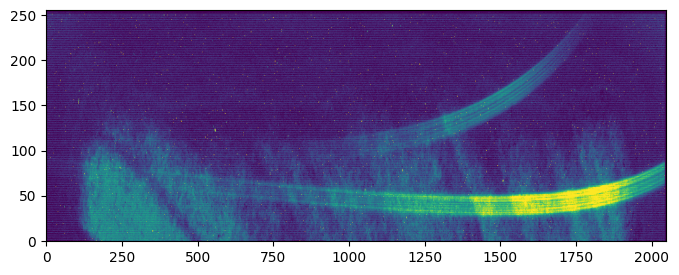

'/data/typhon2/hattie/jwst/wasp_96/DMS_uncal/jw02734002001_04101_00001-seg001_nis_uncal.fits'

In [8]:
plot_spectrum(filenames[0])

In [9]:
step = stage1.DQInitStep(filenames, deepframe=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2025-08-20 11:06:19,789 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 11:06:20,608 - CRDS - INFO -  Calibration SW Found: jwst 1.12.5 (/home/bi19158/Code/soss-data-reduction/venv/lib/python3.10/site-packages/jwst-1.12.5.dist-info)
2025-08-20 11:06:21,246 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 11:06:21,453 - stpipe.DQInitStep - INFO - Step DQInitStep running with args (<Level1bModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_uncal.fits>,).
2025-08-20 11:06:21,457 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:06:21,949 - stpipe.DQInitStep - INFO - Using MASK reference file ./crds_cache/referenc

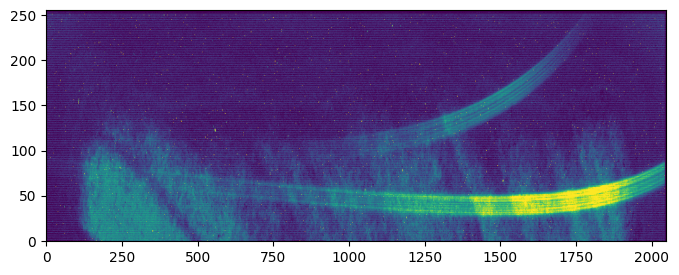

In [10]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [11]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 11:06:47,973 - stpipe.SaturationStep - INFO - SaturationStep instance created.


2025-08-20 11:06:47,993 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 11:06:48,148 - stpipe.SaturationStep - INFO - Step SaturationStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_dqinitstep.fits>,).
2025-08-20 11:06:48,151 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
2025-08-20 11:06:48,187 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2025-08-20 11:06:48,259 - stpipe.SaturationStep - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored
2025-0

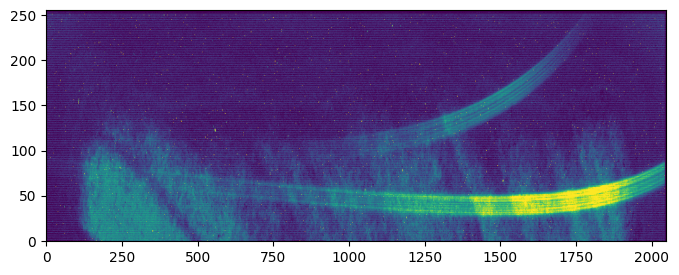

In [12]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [13]:
saturation_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_saturationstep.fits",
]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 11:09:23,108 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 11:09:23,132 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 11:09:23,289 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_saturationstep.fits>,).
2025-08-20 11:09:23,292 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:09:23,329 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0181.fits
2025-08-20 11:09:24,986 - stpipe.SuperBiasStep - INFO - Results used CRDS context: jwst

2025-08-20 11:10:14.286 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 11:10:18.174 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/superbiasstep.png


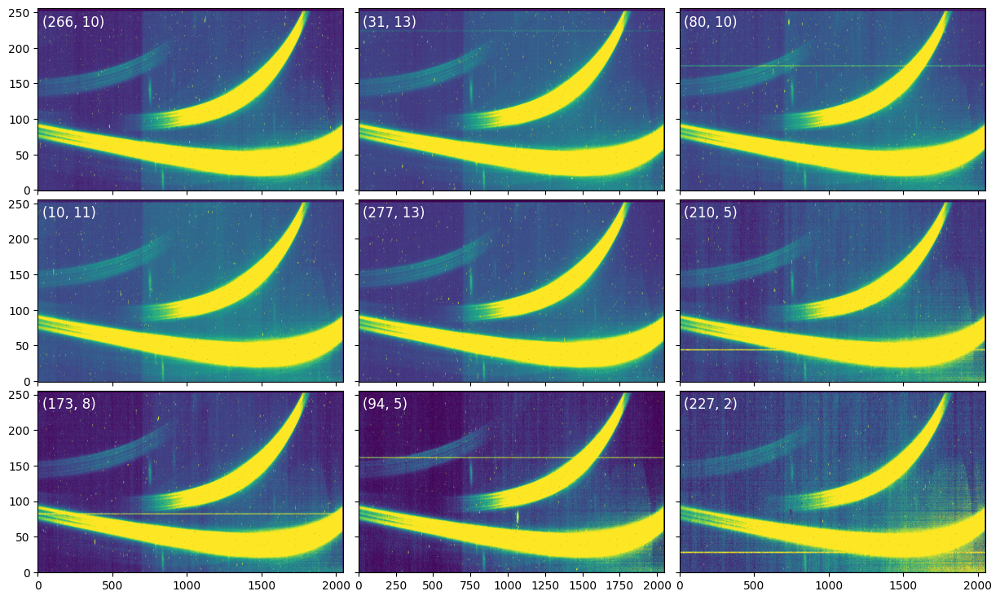

In [ ]:
Image(filename=outdir_s1 + 'superbiasstept.png')

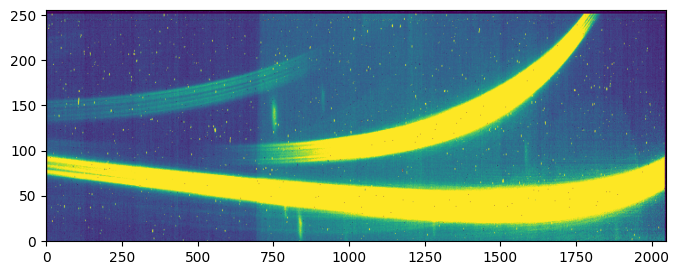

In [15]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [16]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 11:10:18,572 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 11:10:18,593 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 11:10:18,761 - stpipe.RefPixStep - INFO - Step RefPixStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_superbiasstep.fits>,).
2025-08-20 11:10:18,764 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0
2025-08-20 11:10:19,728 - stpipe.RefPixStep - INFO - NIR subarray data
2025-08-20 11:10:19,732 - stpipe.RefPixStep -

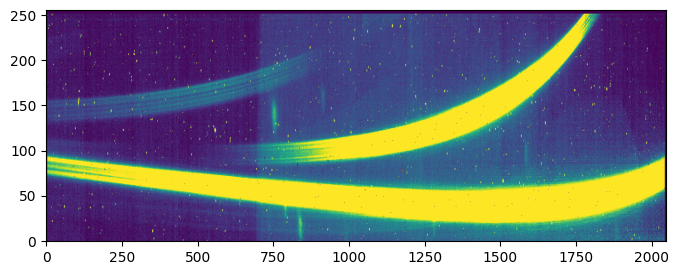

In [17]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [18]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 11:11:30,958 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 11:11:30,980 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 11:11:31,143 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_refpixstep.fits>,).
2025-08-20 11:11:31,145 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None
2025-08-20 11:11:31,182 - stpipe.DarkCurrentStep - INFO - Using DARK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_dark_0171.fits
2025-08-20 11:11:31,307 - stpipe.DarkCurrentStep - INFO - Scien

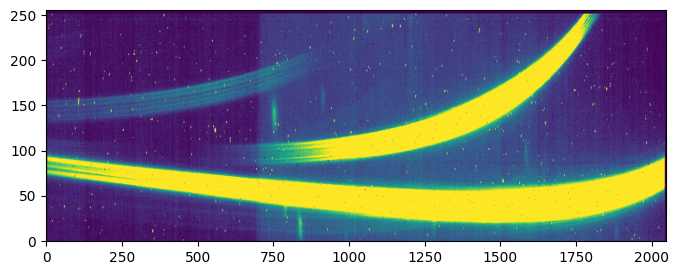

'/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jw02734002001_04101_00001-seg001_nis_darkcurrentstep.fits'

In [19]:
plot_spectrum(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [20]:
background_model = np.load("model_background256.npy")

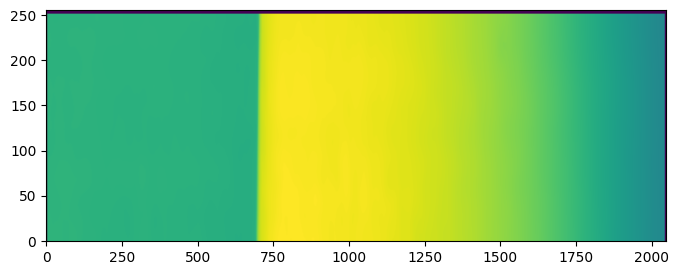

In [21]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [22]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2025-08-20 11:12:21.395 - exoTEDRF - INFO - BackgroundStep instance created.
2025-08-20 11:16:05.851 - exoTEDRF - INFO - Starting background subtraction step.
2025-08-20 11:16:16.108 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2025-08-20 11:19:41.803 - exoTEDRF - INFO - Calculating background model scaling.
2025-08-20 11:19:41.808 - exoTEDRF - INFO - Using differential background scale factors: 0.00323, 0.57353, and shift: 18.17668
2025-08-20 11:19:41.814 - exoTEDRF - INFO - Using differential background scale factors: 0.00179, 1.51036, and shift: 5.57763
2025-08-20 11:19:41.820 - exoTEDRF - INFO - Using differential background scale factors: 1.28020, 3.25520, and shift: 0.00000
2025-08-20 11:19:41.825 - exoTEDRF - INFO - Using differential background scale factors: 3.78153, 5.63536, and shift: 0.00000
2025-08-20 11:19:41.831 - exoTEDRF - INFO - Using differential background scale factors: 6.35295, 8.13160, and shift: 0.00000
2025-08-20 11:19:41.836 - exo

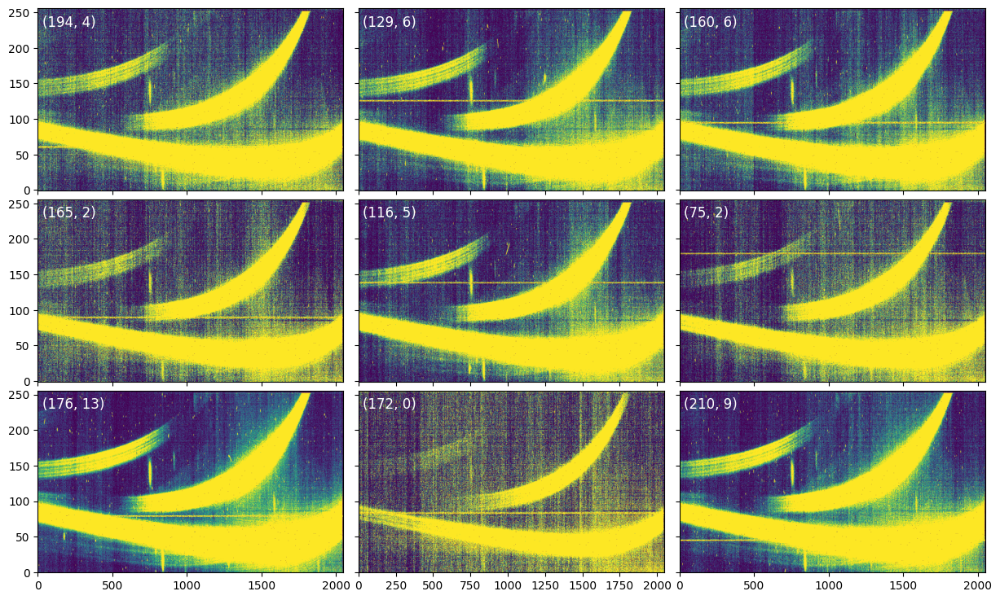

In [23]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

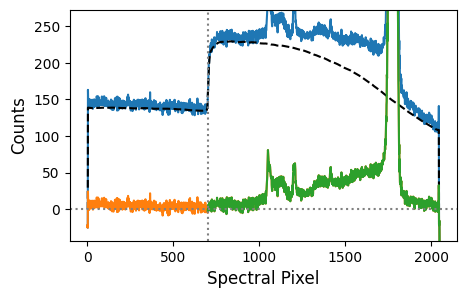

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')

In [25]:
pixel_masks = None
timeseries = None
step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40)

2025-08-20 11:20:51.492 - exoTEDRF - INFO - OneOverFStep instance created.


2025-08-20 11:23:09.706 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-20 11:23:11.575 - exoTEDRF - INFO - Generating a deep stack for each group using baseline integrations.


2025-08-20 11:26:29,373 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2025-08-20 11:26:29.371 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2025-08-20 11:26:30.074 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-20 11:26:30.223 - exoTEDRF - INFO - Constructing trace mask.
2025-08-20 11:26:30.391 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-20 11:28:18.240 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-20 11:28:19.529 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 280/280 [00:37<00:00,  7.50it/s]


2025-08-20 11:29:49.034 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:33:05.073 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2025-08-20 11:33:05.088 - exoTEDRF - INFO - Doing diagnostic plot 2.


100%|██████████| 25/25 [01:56<00:00,  4.68s/it]


2025-08-20 11:42:04.470 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2025-08-20 11:42:04.470 - exoTEDRF - INFO - Step OneOverFStep done.


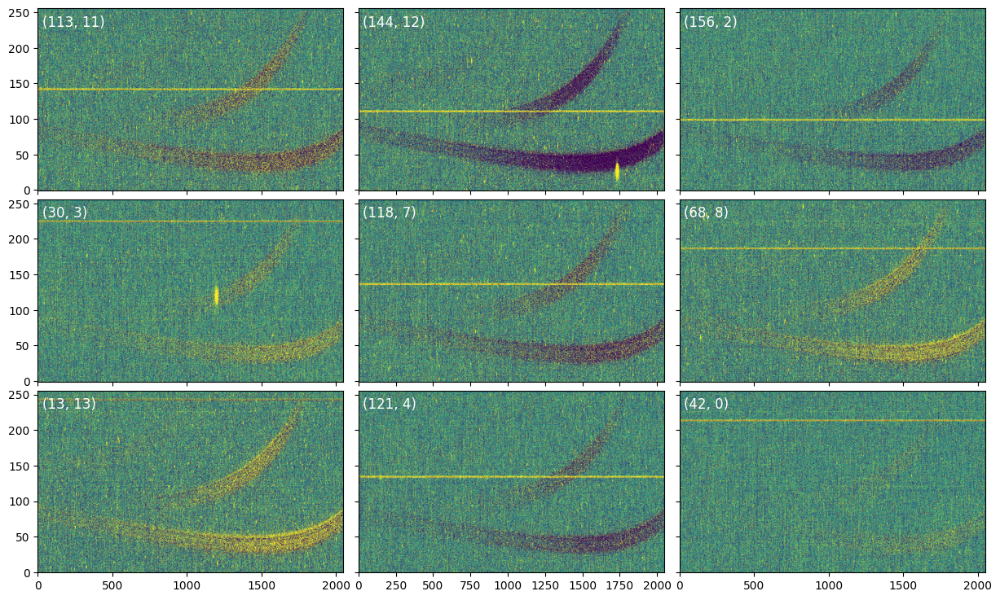

In [26]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')



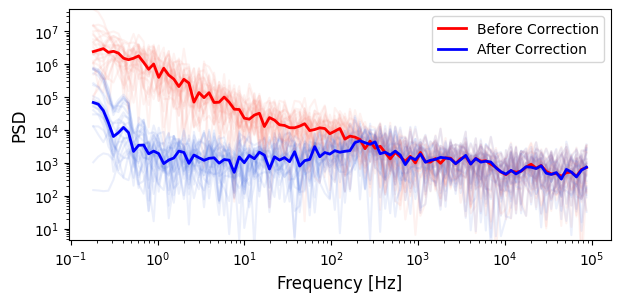

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [28]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 11:42:04,578 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:42:04,598 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:42:04,879 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_oneoverfstep.fits>,).
2025-08-20 11:42:04,881 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:42:04,919 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-20 11:42:05,025 - stpipe.LinearityStep - WARNING - Keyword LOWILLUM does not corr

2025-08-20 11:42:38,648 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:42:38,669 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:42:38,832 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg002_nis_oneoverfstep.fits>,).
2025-08-20 11:42:38,835 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:42:38,871 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-20 11:42:38,973 - stpipe.LinearityStep - WARNING - Keyword LOWILLUM does not corr

2025-08-20 11:43:42.104 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:43:47.608 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/linearitystep_1.png
2025-08-20 11:43:47.639 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-20 11:44:08.483 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/linearitystep_2.png


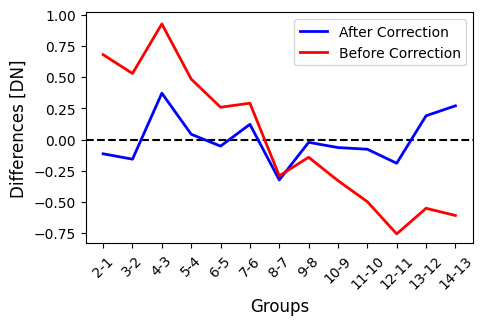

In [29]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



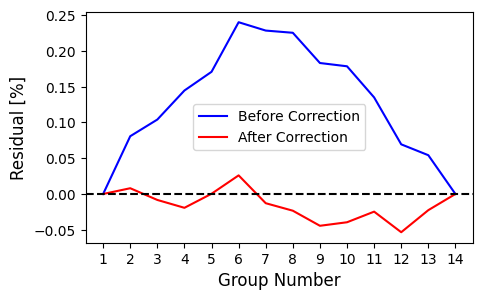

In [30]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [31]:
# linearity_step_files = [
#     f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_linearitystep.fits",
# ]

step = stage1.JumpStep(results, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2025-08-20 11:44:08.625 - exoTEDRF - INFO - Starting time-domain jump detection step.


  0%|          | 0/14 [00:00<?, ?it/s]

100%|██████████| 14/14 [22:36<00:00, 96.90s/it]


2025-08-20 12:06:45.268 - exoTEDRF - INFO - 1706119 jumps flagged
2025-08-20 12:06:45.268 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:06:51.601 - exoTEDRF - INFO - Done
2025-08-20 12:06:51.622 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 14/14 [22:04<00:00, 94.64s/it]


2025-08-20 12:28:56.655 - exoTEDRF - INFO - 1723511 jumps flagged
2025-08-20 12:28:56.655 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:29:02.949 - exoTEDRF - INFO - Done
2025-08-20 12:29:02.970 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 14/14 [17:02<00:00, 73.06s/it]


2025-08-20 12:46:05.907 - exoTEDRF - INFO - 1379502 jumps flagged
2025-08-20 12:46:05.907 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:46:11.031 - exoTEDRF - INFO - Done
2025-08-20 12:46:11.034 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 12:47:27.692 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/jump.png
2025-08-20 12:47:27.713 - exoTEDRF - INFO - Step JumpStep done.


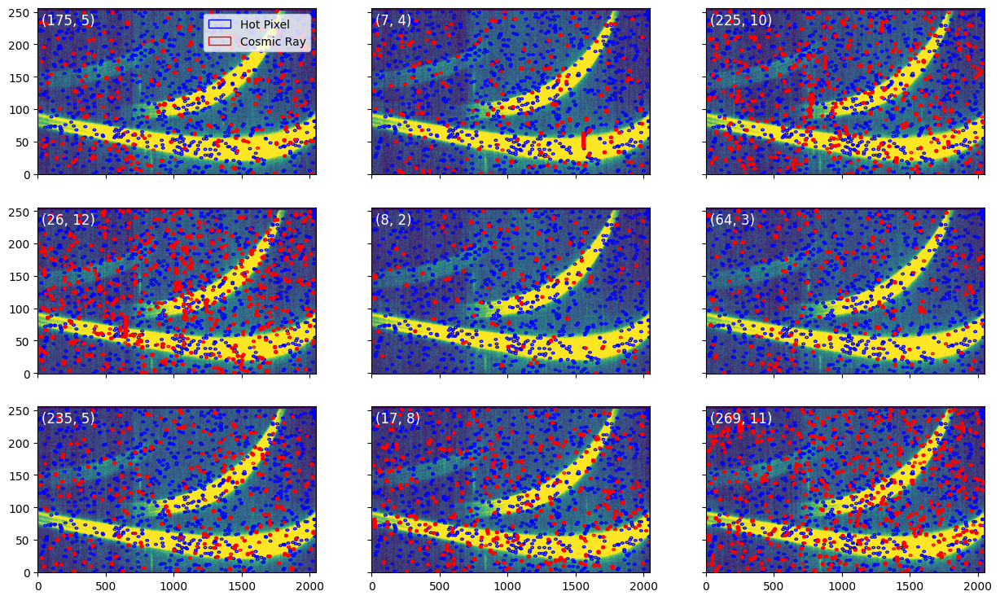

In [32]:
Image(filename=outdir_s1 + 'jump.png')

In [33]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 12:47:28,713 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:47:28,763 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:47:30,096 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg001_nis_jump.fits>,).
2025-08-20 12:47:30,100 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:47:30,154 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:

2025-08-20 12:48:15.241 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:49:11,696 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:49:11,717 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:49:11,903 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(100, 14, 256, 2048) from jw02734002001_04101_00001-seg002_nis_jump.fits>,).
2025-08-20 12:49:11,906 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:49:11,961 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:

2025-08-20 12:49:57.028 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:50:50,584 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:50:50,606 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:50:50,794 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(80, 14, 256, 2048) from jw02734002001_04101_00001-seg003_nis_jump.fits>,).
2025-08-20 12:50:50,797 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:50:50,853 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:5

2025-08-20 12:51:27.883 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.
2025-08-20 12:52:11.014 - exoTEDRF - INFO - Step RampFitStep really done.


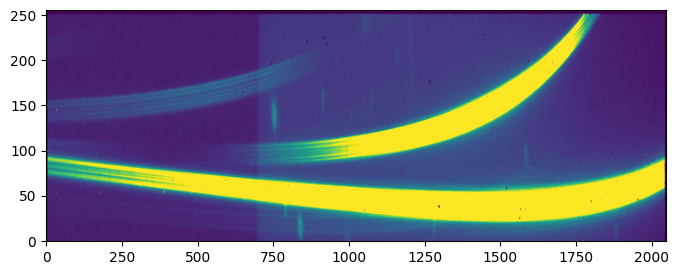

In [34]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()

In [35]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2025-08-20 12:52:11,345 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 12:52:11,363 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 12:52:11,556 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args (<CubeModel(100, 256, 2048) from jw02734002001_04101_00001-seg001_nis_rampfitstep.fits>,).
2025-08-20 12:52:11,559 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 12:52:11,640 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2025-08-20 12:52:11,640 - stpipe.GainScaleStep - INFO - Step will be skipped
2025-08-20 12:52:11,651 - stpipe.GainScaleStep - INFO - Results used CRDS 

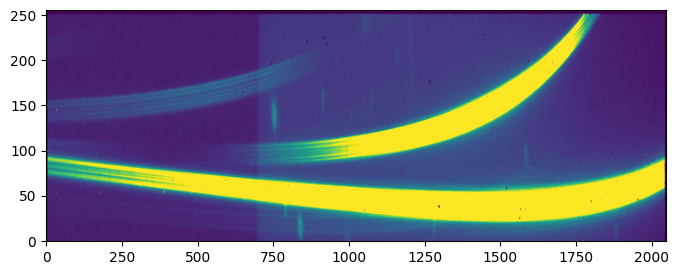

In [36]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()